In [1]:
import pydicom
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import radon, iradon

### Funciones

In [18]:
def print_values(array, name="Array"):
    print(f"------------------Values of {name}----------------------")
    print(f"Max value of {name}:", np.max(array))
    print(f"Min value of {name}:", np.min(array))
    print(f"Mean value of {name}:", np.mean(array))
    print(f"Std value of {name}:", np.std(array))

def histogram_values(array, name="Array", bins=100, log_scale=False):
    """
    Visualiza un histograma con mejor formato y control sobre los parámetros.

    Parámetros:
    -----------
    array : np.ndarray
        Datos numéricos a graficar.
    name : str
        Nombre descriptivo del conjunto de datos (para el título y etiquetas).
    bins : int o secuencia
        Número de bins o bordes del histograma.
    log_scale : bool
        Si es True, usa escala logarítmica en el eje Y.
    """
    # Asegurar que el array sea plano
    array = np.asarray(array).ravel()
    
    # Crear histograma
    hist, bin_edges = np.histogram(array, bins=bins)

    # Crear figura
    plt.figure(figsize=(8, 5))
    plt.bar(
        bin_edges[:-1],
        hist,
        width=np.diff(bin_edges),
        color='steelblue',
        edgecolor='black',
        alpha=0.7
    )
    
    # Etiquetas y formato
    plt.title(f"Distribución de valores - {name}", fontsize=14)
    plt.xlabel("Valor de píxel", fontsize=12)
    plt.ylabel("Frecuencia", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    
    if log_scale:
        plt.yscale('log')
        plt.ylabel("Frecuencia (escala log)")
    
    plt.tight_layout()
    plt.show()

## Fantomas

In [19]:
def apply_ld_sinogram_phan(high_path, mas_des):

    '''
    Apply low-dose simulation to a high-dose slice
    '''

    #-------CONSTANTES PARA SIMULACIÓN DE BAJA DOSIS-----------------------------
    #a * mas +b = k, acceptable values:
    # a nd b are the range of (0.008484, 0.01508) and (-0.0383, 0.1002), respectively Paper used: a = 0.0095, b = 0.0309, here we used the maximum values
    a = 0.015
    b = 0.1002
    #exposure_mAs = pydicom.dcmread(high_path).Exposure
    dcm = pydicom.dcmread(high_path)
    exp_time_elem = dcm.get((0x0018, 0x1150))  # ExposureTime
    current_elem = dcm.get((0x0018, 0x1151))   # XRayTubeCurrent
    exp_time = float(exp_time_elem.value) if exp_time_elem is not None else 0
    current = float(current_elem.value) if current_elem is not None else 0
    pitch = 0.7  # typical value
    if exp_time_elem == None or current_elem == None:
        exposure_mAs = 200
    else:
        exposure_mAs = ((exp_time / 1000) * current)/pitch
    #print("Exposure mAs:", exposure_mAs)
    flux_per_mAs = 1000  # arbitrary value for flux per mAs
    k = a * mas_des + b
    #sig = np.sqrt(10) 
    inc_flux = exposure_mAs * flux_per_mAs

    CONT_FIG = 500
    #-----------------------------------------------------------------------------

    #-------SIMULACIÓN DE BAJA DOSIS-----------
    #CT SLICE DE ALTA DOSIS
    #Step 1: Leer la imagen de alta dosis
    h_slice = pydicom.dcmread(high_path).pixel_array
    h_slice = h_slice.astype(np.float64)  # Asegura precisión
    #Normalize between 0 and 1
    h_slice = (h_slice - np.min(h_slice)) / (np.max(h_slice) - np.min(h_slice))
    #print_values(h_slice, "High Dose Slice")

    #SINOGRAMA DE ALTA DOSIS
    #Step 2: Generación del sinograma de alta dosis usando la transformada de Radon
    theta = np.linspace(0.0, 180.0, max(h_slice.shape), endpoint=False)
    sinogram = radon(h_slice, theta=theta)*(1.0/CONT_FIG)
    #histogram_values(sinogram, "High Dose Sinogram")
    #print_values(sinogram, "High Dose Sinogram")

    #FLUJO PROPORCIONAL DE ALTA DOSIS (Tnd, proporción de fotones transmitidos)
    #Step 3: Conversión del sinograma de alta dosis al dominio de transmisión, mediante Tnd = exp(−pnd).
    t_nd = np.exp(-sinogram) 
    #print_values(t_nd, "Transmission High Dose (Tnd)")

    # FLUJO TRANSMITIDO DE BAJA DOSIS (MULTIPLICADO POR CANTIDAD DE ELECTRONES INCIDENTES)
    #Step 4: Ajuste del flujo incidente para simular baja dosis, escalando el flujo original en base a la relación entre dosis alta y baja.
    # Flujo transmitido -> I = I0 * T 
    #I0 = k * inc_flux
    #I = k * inc_flux * T
    transm_flux = k * inc_flux * t_nd #(500 * t_nd).astype(int) 
    #print_values(transm_flux, "Transmitted Flux Low Dose")

    #RUIDO EN EL FLUJO TRANSMITIDO DE BAJA DOSIS
    #Step 5: Se agrega el ruido Poisson y el ruido gaussiano (electrónico) a la señal transmitida.
    transm_noisy = np.random.poisson(transm_flux) #+ np.random.normal(0, np.sqrt(transm_flux)*0.05)
    #print_values(transm_noisy, "Transmitted Flux Low Dose with Poisson Noise")

    #SINOGRAMA DE BAJA DOSIS 
    #SE VUELVE AL DOMINIO DE PROYECCIÓN/SINOGRAMA
    #Step 6: p = log (I0 / I) = - log (I / I0)
    # Transformación inversa al dominio del sinograma, aplicando pld,sim = − ln(Ild,sim/Ild0),
    # donde Ild,sim representa la transmisión simulada con ruido.
    sino_ld = -1 * (np.log(transm_noisy/(k * inc_flux)))
    sino_ld[transm_noisy <= 0] = 0

    sinogram_ld = sino_ld*CONT_FIG
    #histogram_values(sinogram_ld, "Low Dose Sinogram (after noise simulation)")
    #print_values(sinogram_ld, "Low Dose Sinogram (after noise simulation)")

    #RECONSTRUCCIÓN DE LA IMAGEN CT (SLICE BAJA DOSIS)
    #Step7: Reconstrucción de la imagen usando el método de Filtered back projection (FBP)
    low_slice = iradon(sinogram_ld, theta=theta, filter_name='hann') #* 1024
    #print_values(low_slice, "Reconstructed Low Dose Slice")

    return h_slice, low_slice, sinogram_ld

Exposure mAs: 300.0
------------------Values of High Dose Slice----------------------
Max value of High Dose Slice: 1.0
Min value of High Dose Slice: 0.0
Mean value of High Dose Slice: 0.2521195458844575
Std value of High Dose Slice: 0.2754896233024087


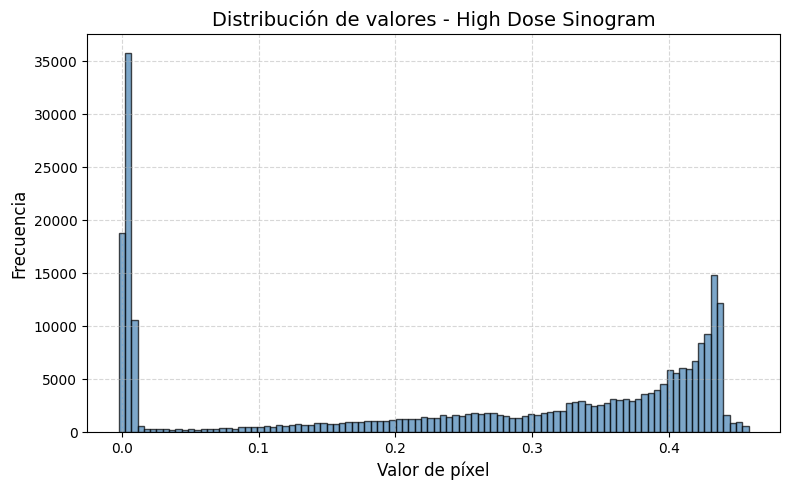

------------------Values of High Dose Sinogram----------------------
Max value of High Dose Sinogram: 0.4605569331035919
Min value of High Dose Sinogram: 0.0
Mean value of High Dose Sinogram: 0.25700602131046857
Std value of High Dose Sinogram: 0.16935326375272106
------------------Values of Transmission High Dose (Tnd)----------------------
Max value of Transmission High Dose (Tnd): 1.0
Min value of Transmission High Dose (Tnd): 0.630932160632853
Mean value of Transmission High Dose (Tnd): 0.7848091778582507
Std value of Transmission High Dose (Tnd): 0.13771014840779466
------------------Values of Transmitted Flux Low Dose----------------------
Max value of Transmitted Flux Low Dose: 255060.0
Min value of Transmitted Flux Low Dose: 160925.55689101547
Mean value of Transmitted Flux Low Dose: 200173.4289045254
Std value of Transmitted Flux Low Dose: 35124.350452892104
------------------Values of Transmitted Flux Low Dose with Poisson Noise----------------------
Max value of Transmitted 

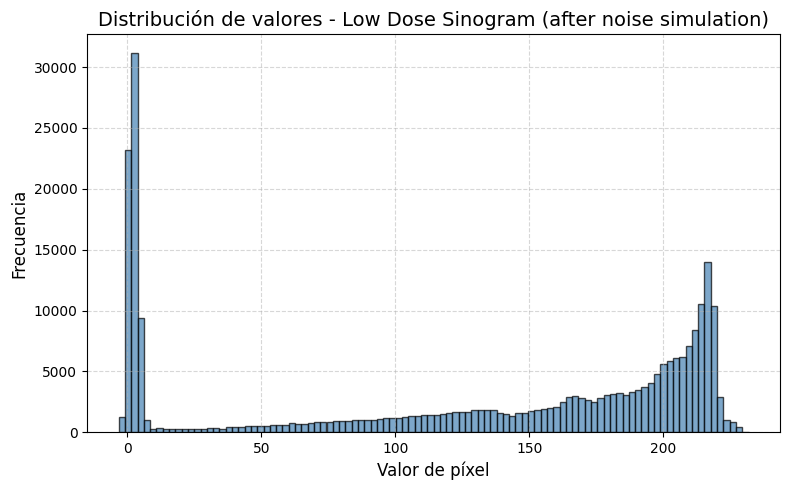

------------------Values of Low Dose Sinogram (after noise simulation)----------------------
Max value of Low Dose Sinogram (after noise simulation): 233.02501708524795
Min value of Low Dose Sinogram (after noise simulation): -2.0599708698641717
Mean value of Low Dose Sinogram (after noise simulation): 128.50545738595656
Std value of Low Dose Sinogram (after noise simulation): 84.6835606736867
------------------Values of Reconstructed Low Dose Slice----------------------
Max value of Reconstructed Low Dose Slice: 1.019266766758867
Min value of Reconstructed Low Dose Slice: -0.040438312347249955
Mean value of Reconstructed Low Dose Slice: 0.2508239769490286
Std value of Reconstructed Low Dose Slice: 0.27565795940524895


In [ ]:
phan_path = "/home/cfigueroa/LDCT_respaldo/dosis8_9/Dosis_Dosis8/Tac_Medicion_Dosis - AGFA000000027237/811_high_075_Hr40_3_B_Sn150kV_38/IM-0032-0300.dcm"
des_mask = 50
h_sli, low_slice_phan, _ = apply_ld_sinogram_phan(phan_path, des_mask)

In [47]:
phan_path_ld = "/home/cfigueroa/LDCT_respaldo/dosis8_9/Dosis_Dosis8/Tac_Medicion_Dosis - AGFA000000027237/82_high_075_Hr40_5_B_Sn150kV_9/IM-0005-0300.dcm"
low_slice_real = pydicom.dcmread(phan_path_ld).pixel_array
low_slice_real = low_slice_real.astype(np.float64)

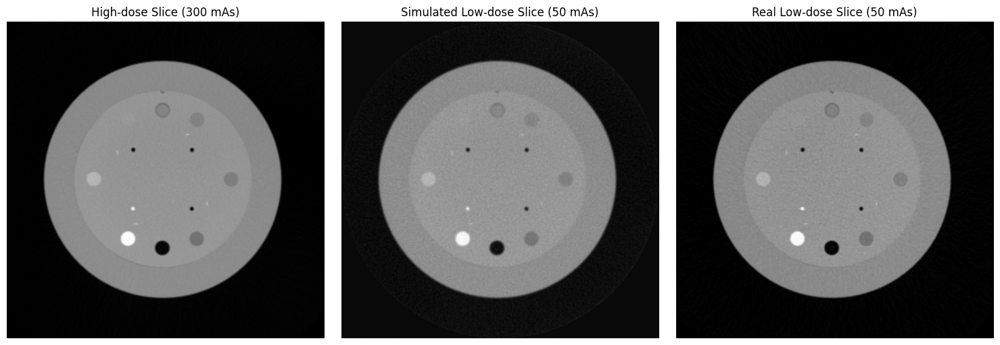

In [48]:
#Fantoma MAS 50

plt.figure(figsize=(15, 5)) 
plt.subplot(1, 3, 1)
plt.imshow(h_sli, cmap='gray')
plt.title("High-dose Slice (300 mAs)")
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(low_slice_phan, cmap='gray')
plt.title("Simulated Low-dose Slice (50 mAs)")
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(low_slice_real, cmap='gray')
plt.title("Real Low-dose Slice (50 mAs)")
plt.axis('off')
plt.tight_layout()
plt.show()

In [49]:
phan_path_ld2 = "/home/cfigueroa/LDCT_respaldo/dosis8_9/Dosis_Dosis8/Tac_Medicion_Dosis - AGFA000000027237/81_high_075_Hr40_3_B_Sn150kV_6/IM-0002-0300.dcm"
low_slice_real2 = pydicom.dcmread(phan_path_ld2).pixel_array
low_slice_real2 = low_slice_real2.astype(np.float64)

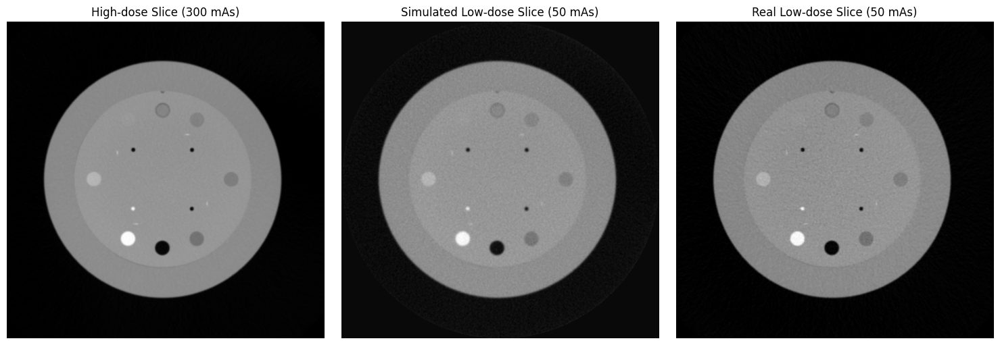

In [50]:
plt.figure(figsize=(15, 5)) 
plt.subplot(1, 3, 1)
plt.imshow(h_sli, cmap='gray')
plt.title("High-dose Slice (300 mAs)")
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(low_slice_phan, cmap='gray')
plt.title("Simulated Low-dose Slice (50 mAs)")
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(low_slice_real2, cmap='gray')
plt.title("Real Low-dose Slice (50 mAs)")
plt.axis('off')
plt.tight_layout()
plt.show()

Exposure mAs: 300.0
------------------Values of High Dose Slice----------------------
Max value of High Dose Slice: 1.0
Min value of High Dose Slice: 0.0
Mean value of High Dose Slice: 0.2521195458844575
Std value of High Dose Slice: 0.2754896233024087


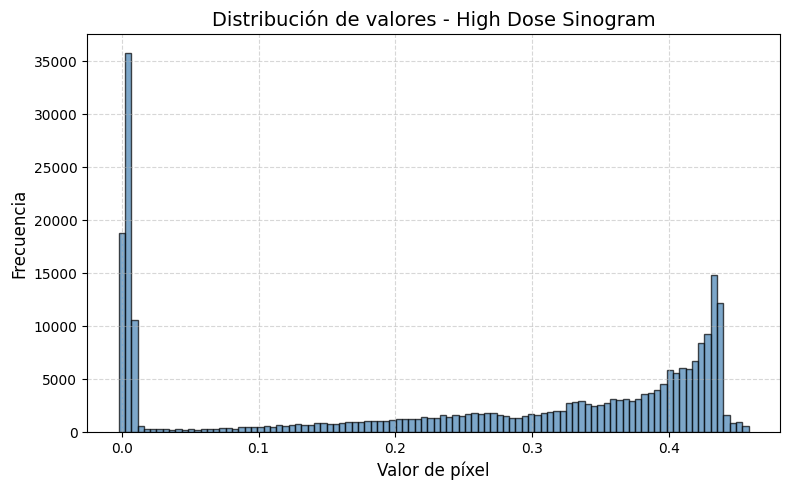

------------------Values of High Dose Sinogram----------------------
Max value of High Dose Sinogram: 0.4605569331035919
Min value of High Dose Sinogram: 0.0
Mean value of High Dose Sinogram: 0.25700602131046857
Std value of High Dose Sinogram: 0.16935326375272106
------------------Values of Transmission High Dose (Tnd)----------------------
Max value of Transmission High Dose (Tnd): 1.0
Min value of Transmission High Dose (Tnd): 0.630932160632853
Mean value of Transmission High Dose (Tnd): 0.7848091778582507
Std value of Transmission High Dose (Tnd): 0.13771014840779466
------------------Values of Transmitted Flux Low Dose----------------------
Max value of Transmitted Flux Low Dose: 781560.0
Min value of Transmitted Flux Low Dose: 493111.33946421253
Mean value of Transmitted Flux Low Dose: 613375.4610468943
Std value of Transmitted Flux Low Dose: 107628.743589596
------------------Values of Transmitted Flux Low Dose with Poisson Noise----------------------
Max value of Transmitted Fl

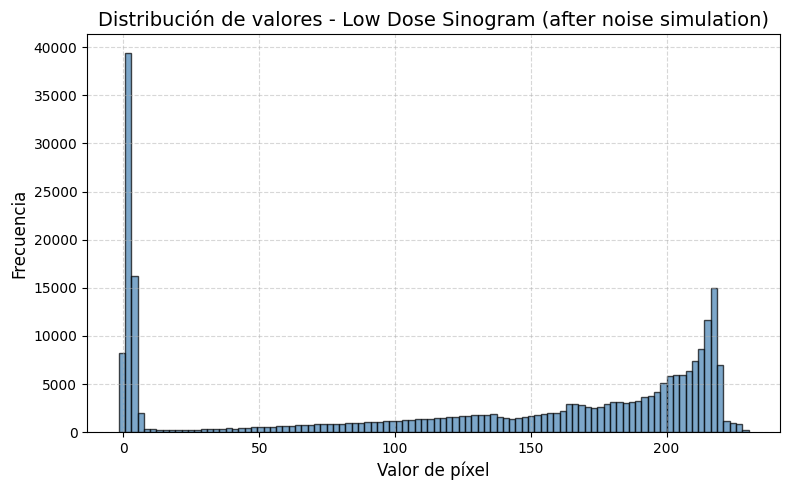

------------------Values of Low Dose Sinogram (after noise simulation)----------------------
Max value of Low Dose Sinogram (after noise simulation): 231.3578248185776
Min value of Low Dose Sinogram (after noise simulation): -0.6016390112263824
Mean value of Low Dose Sinogram (after noise simulation): 128.50391110216745
Std value of Low Dose Sinogram (after noise simulation): 84.67913090645068
------------------Values of Reconstructed Low Dose Slice----------------------
Max value of Reconstructed Low Dose Slice: 1.0091575199325054
Min value of Reconstructed Low Dose Slice: -0.02552463125557055
Mean value of Reconstructed Low Dose Slice: 0.25082295770807916
Std value of Reconstructed Low Dose Slice: 0.2755170798392513


In [ ]:
des_mask = 167
h_sli, low_slice_phan, _ = apply_ld_sinogram_phan(phan_path, des_mask)

In [58]:
phan_path_ld5 = "/home/cfigueroa/LDCT_respaldo/dosis8_9/Dosis_Dosis8/Tac_Medicion_Dosis - AGFA000000027237/86_high_075_Hr40_3_B_Sn150kV_21/IM-0017-0300.dcm"
low_slice_real5 = pydicom.dcmread(phan_path_ld5).pixel_array
low_slice_real5 = low_slice_real5.astype(np.float64)

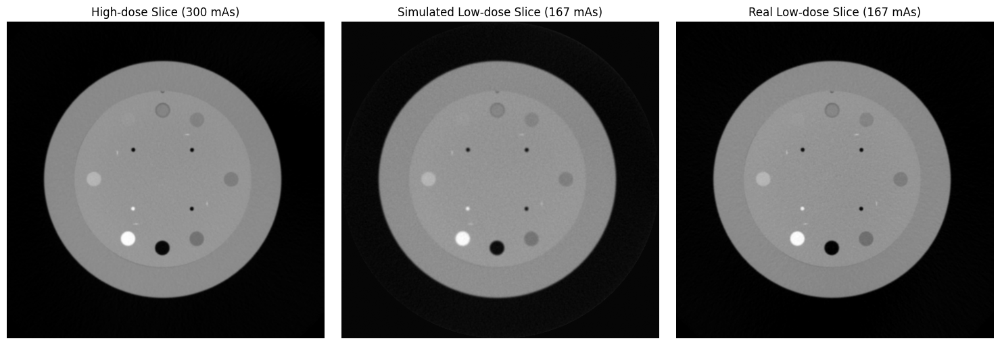

In [59]:
plt.figure(figsize=(15, 5)) 
plt.subplot(1, 3, 1)
plt.imshow(h_sli, cmap='gray')
plt.title("High-dose Slice (300 mAs)")
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(low_slice_phan, cmap='gray')
plt.title("Simulated Low-dose Slice (167 mAs)")
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(low_slice_real5, cmap='gray')
plt.title("Real Low-dose Slice (167 mAs)")
plt.axis('off')
plt.tight_layout()
plt.show()

## Métricas y guardado fantomas

SNR y CNR comprar numéricamente con fantomas de baja dosis

In [2]:
dosis8_path = "/home/cfigueroa/LDCT_respaldo/dosis8_9/Dosis_Dosis8/Tac_Medicion_Dosis - AGFA000000027237/"
hd_path = "/home/cfigueroa/LDCT_respaldo/dosis8_9/Dosis_Dosis8/Tac_Medicion_Dosis - AGFA000000027237/811_high_075_Hr40_3_B_Sn150kV_38/IM-0032-0271.dcm"

In [3]:
#load hd slice using pydicom
import pydicom
import numpy as np
hd_slice = pydicom.dcmread(hd_path).pixel_array
hd_slice = hd_slice.astype(np.float64)
print(hd_slice.shape)

(512, 512)


In [4]:
roi = hd_slice[342:355, 300:313] 
roi2 = hd_slice[342:355, 189:202]

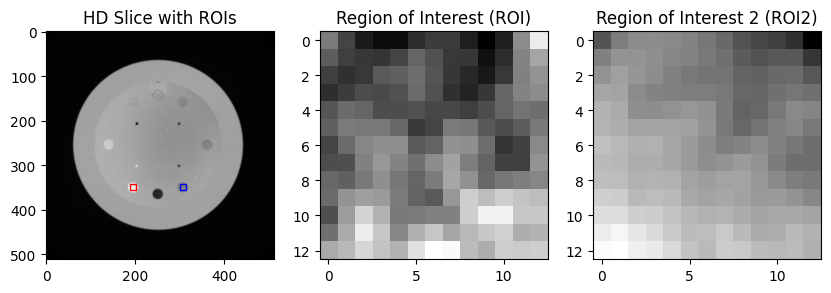

In [5]:
#mostrar la figura y el roi en una misma foto
fig, ax = plt.subplots(1, 3, figsize=(10, 5))
ax[0].imshow(hd_slice, cmap='gray')
#cambiar por el roi anterior
rect = plt.Rectangle((189, 342), 13, 13, edgecolor='r', facecolor='none')
rect2 = plt.Rectangle((300, 342), 13, 13, edgecolor='b', facecolor='none')
ax[0].add_patch(rect)
ax[0].add_patch(rect2)
ax[0].set_title('HD Slice with ROIs')
ax[1].imshow(roi, cmap='gray')
ax[1].set_title('Region of Interest (ROI)')
ax[2].imshow(roi2, cmap='gray')
ax[2].set_title('Region of Interest 2 (ROI2)')
plt.show()

In [6]:
def calculate_snr_cnr(ev_slice):
    #ROIs (coordenadas [y1:y2, x1:x2])
    roi_tejido = ev_slice[342:355, 300:313] 
    roi_tejido2 = ev_slice[342:355, 189:202]
    mu_tejido, sigma_tejido = np.mean(roi_tejido), np.std(roi_tejido)
    mu_tejido2, sigma_tejido2 = np.mean(roi_tejido2), np.std(roi_tejido2)
    snr_tejido1 = mu_tejido / sigma_tejido
    snr_tejido2 = mu_tejido2 / sigma_tejido2
    cnr = (mu_tejido - mu_tejido2) / ((sigma_tejido + sigma_tejido2) / 2)
    return snr_tejido1, snr_tejido2, cnr, sigma_tejido

In [7]:
import os
import pydicom
import numpy as np
import SimpleITK as sitk
import pandas as pd
import nibabel as nib
import matplotlib.pyplot as plt
import sys
sys.path.append("/home/cfigueroa")

In [8]:
def affine_from_dicom(path_dcms):
    reader = sitk.ImageSeriesReader()
    dicom_names = reader.GetGDCMSeriesFileNames(path_dcms)
    reader.SetFileNames(dicom_names)
    image = reader.Execute()
    origin = np.array(image.GetOrigin())  # Physical coordinates of the image origin
    spacing = np.array(image.GetSpacing()) # Physical spacing between pixels/voxels
    direction = np.array(image.GetDirection()).reshape(3, 3) # Direction cosines of the image axes

    spacing[0] = spacing[0] * 2
    spacing[1] = spacing[1] * 2
    
    # Create an identity 4x4 matrix
    affine_matrix = np.eye(4)

    # Apply scaling and rotation/orientation
    # The direction matrix already incorporates the spacing implicitly when transforming physical points
    # However, for the affine matrix that transforms voxel coordinates to physical coordinates,
    # you need to explicitly multiply the direction by the spacing.
    affine_matrix[:3, :3] = direction @ np.diag(spacing)

    # Set the translation component (origin)
    affine_matrix[:3, 3] = origin

    return affine_matrix

In [20]:
def metrics_simulation(phan_path, list_phantoms, list_mas, base_dose_path, ld_method="1", save_path=False):
    '''
    param 
        phan_path: Path to the folder containing the phantoms.
        list_phantoms: List of phantom names to process.
        list_mas: List of mAs values (same length as number of phantoms high dose).
        base_dose_path: Folder path with high dose images.
        ld_method: Method for low dose sinogram simulation (default is "1").
        save_path: If str (path), saves simulated slices and metrics CSV.
    '''
    prom_snr_sim1, prom_snr_sim2, prom_cnr_sim, prom_sigma_sim = [], [], [], []
    prom_snr_real1, prom_snr_real2, prom_cnr_real, prom_sigma_real = [], [], [], []

    low_slices_arrays = []
    low_slices_arrays_real = []

    results = []  # para acumular resultados de cada phantom

    a = 0
    for i in range(len(list_phantoms)):
        print(f"Processing phantom: {list_phantoms[i]}")
        if "high" not in list_phantoms[i]:
            continue
        phantom = list_phantoms[i]
        images = os.path.join(phan_path, phantom)
        affine_matrix = affine_from_dicom(os.path.join(phan_path, phantom))
        list_dcms = sorted(os.listdir(images))

        # High dose
        list_dcms_h = sorted(os.listdir(base_dose_path))

        # --- Real LD ---
        snrs_real1, snrs_real2, cnrs_real, sigmas_real, list_slices_real = [], [], [], [], []
        for j in range(len(list_dcms)):
            dcm = os.path.join(phan_path, phantom, list_dcms[j])
            slice_dcm = pydicom.dcmread(dcm).pixel_array
            snr_real1, snr_real2, cnr_real, sigma_real = calculate_snr_cnr(slice_dcm)
            snrs_real1.append(snr_real1)
            snrs_real2.append(snr_real2)
            cnrs_real.append(cnr_real)
            sigmas_real.append(sigma_real)
            list_slices_real.append(slice_dcm.T)
        low_slices_arrays_real.append(list_slices_real)

        # --- Simulated LD ---
        snrs_sim1, snrs_sim2, cnrs_sim, sigmas_sim, list_slices_sim = [], [], [], [], []
        mas = list_mas[a] #// 2
        a += 1

        for j in range(len(list_dcms_h)):
            dcm_h = os.path.join(base_dose_path, list_dcms_h[j])
            h_slice, low_slice, low_sinogram = apply_ld_sinogram_phan(dcm_h, mas)
            snr_sim1, snr_sim2, cnr_sim, sigma_sim = calculate_snr_cnr(low_slice)
            snrs_sim1.append(snr_sim1)
            snrs_sim2.append(snr_sim2)
            cnrs_sim.append(cnr_sim)
            sigmas_sim.append(sigma_sim)
            list_slices_sim.append(low_slice.T)

        if save_path:
            save_path_ld = os.path.join(save_path, f'low_slices_sim_{phantom}_mas_{mas}.nii')
            save_path_real = os.path.join(save_path, f'low_slices_real_{phantom}_mas_{mas}.nii')
            #nib.save(nib.Nifti1Image(np.array(list_slices_sim), affine_matrix), save_path_ld)
            #nib.save(nib.Nifti1Image(np.array(list_slices_real), affine_matrix), save_path_real)

            img_array_3D = np.stack(list_slices_real[::-1], axis=-1)
            ld_array_3D = np.stack(list_slices_sim[::-1], axis=-1)
            img_nii = nib.Nifti1Image(img_array_3D, affine_matrix)  # Save aSxis for data (just identity)
            ld_nii = nib.Nifti1Image(ld_array_3D, affine_matrix)
            img_nii.to_filename(save_path_real)  # Save as NiBabel file
            ld_nii.to_filename(save_path_ld)  # Save as NiBabel file
            #np.save(os.path.join(save_path, f'low_slices_sim_{phantom}_mas_{mas}.npy'), np.array(list_slices_sim))

        # Guardamos promedios
        mean_snr_sim1, mean_snr_sim2, mean_cnr_sim, mean_sigma_sim = np.mean(snrs_sim1), np.mean(snrs_sim2), np.mean(cnrs_sim), np.mean(sigmas_sim)
        mean_snr_real1, mean_snr_real2, mean_cnr_real, mean_sigma_real = np.mean(snrs_real1), np.mean(snrs_real2), np.mean(cnrs_real), np.mean(sigmas_real)

        prom_snr_sim1.append(mean_snr_sim1)
        prom_snr_sim2.append(mean_snr_sim2)
        prom_cnr_sim.append(mean_cnr_sim)
        prom_sigma_sim.append(mean_sigma_sim)
        low_slices_arrays.append(list_slices_sim)

        prom_snr_real1.append(mean_snr_real1)
        prom_snr_real2.append(mean_snr_real2)
        prom_cnr_real.append(mean_cnr_real)
        prom_sigma_real.append(mean_sigma_real)

        print("Number of slices real:", len(snrs_real1  ))
        print("Number of slices simulated:", len(snrs_sim1))

        print(
            f'phantom: {phantom}, mAs: {mas}, '
            f'snr 1: {mean_snr_sim1:.4f} ± {np.std(snrs_sim1):.4f}, '
            f'snr real1: {mean_snr_real1:.4f} ± {np.std(snrs_real1):.4f}, '
            f'snr 2: {mean_snr_sim2:.4f} ± {np.std(snrs_sim2):.4f}, '
            f'snr real2: {mean_snr_real2:.4f} ± {np.std(snrs_real2):.4f}, '
            f'cnr: {mean_cnr_sim:.4f} ± {np.std(cnrs_sim):.4f}, '
            f'cnr real: {mean_cnr_real:.4f} ± {np.std(cnrs_real):.4f}, '
            f'sigma: {mean_sigma_sim:.4f} ± {np.std(sigmas_sim):.4f}, '
            f'sigma real: {mean_sigma_real:.4f} ± {np.std(sigmas_real):.4f}'
        )

        # Agregamos al diccionario de resultados
        results.append({
            "phantom": phantom,
            "mAs": mas,
            "snr_sim1_mean": mean_snr_sim1,
            "snr_sim2_mean": mean_snr_sim2,
            "snr_real1_mean": mean_snr_real1,
            "snr_real2_mean": mean_snr_real2,
            "cnr_sim_mean": mean_cnr_sim,
            "cnr_real_mean": mean_cnr_real,
            "sigma_sim_mean": mean_sigma_sim,
            "sigma_real_mean": mean_sigma_real,
        })

    # Guardamos CSV
    if save_path:
        df = pd.DataFrame(results)
        csv_path = os.path.join(save_path, "metrics_results2.csv")
        df.to_csv(csv_path, index=False)
        print(f"Resultados guardados en {csv_path}")

    return prom_snr_sim1, prom_snr_sim2, prom_cnr_sim, prom_sigma_sim, prom_snr_real1, prom_snr_real2, prom_cnr_real, prom_sigma_real, low_slices_arrays, low_slices_arrays_real

In [21]:
base_dose_path = '/home/cfigueroa/LDCT_respaldo/dosis8_9/Dosis_Dosis8/Tac_Medicion_Dosis - AGFA000000027237/811_high_075_Hr40_3_B_Sn150kV_38/'
dosis8_path = "/home/cfigueroa/LDCT_respaldo/dosis8_9/Dosis_Dosis8/Tac_Medicion_Dosis - AGFA000000027237"
list_dosis8 = sorted(os.listdir(dosis8_path))
list_dosis8_high = [f for f in list_dosis8 if "high" in f]

In [22]:
list_mas_dosis8 = [267, 300, 50, 50, 67, 100, 133, 167, 200, 233, 33]
save_p = "/home/cfigueroa/LDCT_respaldo/dosis8_9/dosis8_sim"

In [18]:
# POISON + GAUSSIAN NOISE SIMULATION METRICS
prom_snr_sim1, prom_snr_sim2, prom_cnr_sim, prom_sigma_sim, prom_snr_real1, prom_snr_real2, prom_cnr_real, prom_sigma_real, low_slices_arrays, low_slices_arrays_real = metrics_simulation(dosis8_path, list_dosis8, list_mas_dosis8, base_dose_path, save_path = save_p)

Processing phantom: .DS_Store
Processing phantom: 810_high_075_Hr40_3_B_Sn150kV_35
Number of slices real: 327
Number of slices simulated: 327
phantom: 810_high_075_Hr40_3_B_Sn150kV_35, mAs: 267, snr 1: 83.3212 ± 38.2163, snr real1: 82.6504 ± 32.3977, snr 2: 85.4061 ± 38.7401, snr real2: 86.1345 ± 32.3630, cnr: -4.6116 ± 13.7931, cnr real: -6.5040 ± 19.4313, sigma: 0.0150 ± 0.0465, sigma real: 19.5194 ± 55.5251
Processing phantom: 810_low_075_Hr40_3_A_80kV_34
Processing phantom: 810_mean_075_Hr40_3_M_05_36
Processing phantom: 811_high_075_Hr40_3_B_Sn150kV_38
Number of slices real: 327
Number of slices simulated: 327
phantom: 811_high_075_Hr40_3_B_Sn150kV_38, mAs: 300, snr 1: 85.9048 ± 39.6480, snr real1: 87.0778 ± 33.9588, snr 2: 87.4609 ± 39.4089, snr real2: 89.7171 ± 33.5259, cnr: -4.6700 ± 13.9579, cnr real: -6.7741 ± 20.3728, sigma: 0.0148 ± 0.0465, sigma real: 19.1451 ± 56.4911
Processing phantom: 811_low_075_Hr40_3_A_80kV_37
Processing phantom: 811_mean_075_Hr40_3_M_05_39
Processi

In [23]:
# SOLO POISON NOISE 
prom_snr_sim1, prom_snr_sim2, prom_cnr_sim, prom_sigma_sim, prom_snr_real1, prom_snr_real2, prom_cnr_real, prom_sigma_real, low_slices_arrays, low_slices_arrays_real = metrics_simulation(dosis8_path, list_dosis8, list_mas_dosis8, base_dose_path, save_path = save_p)

Processing phantom: .DS_Store
Processing phantom: 810_high_075_Hr40_3_B_Sn150kV_35
Number of slices real: 327
Number of slices simulated: 327
phantom: 810_high_075_Hr40_3_B_Sn150kV_35, mAs: 267, snr 1: 83.4285 ± 38.3777, snr real1: 82.6504 ± 32.3977, snr 2: 84.7209 ± 38.3581, snr real2: 86.1345 ± 32.3630, cnr: -4.6008 ± 13.7484, cnr real: -6.5040 ± 19.4313, sigma: 0.0150 ± 0.0465, sigma real: 19.5194 ± 55.5251
Processing phantom: 810_low_075_Hr40_3_A_80kV_34
Processing phantom: 810_mean_075_Hr40_3_M_05_36
Processing phantom: 811_high_075_Hr40_3_B_Sn150kV_38
Number of slices real: 327
Number of slices simulated: 327
phantom: 811_high_075_Hr40_3_B_Sn150kV_38, mAs: 300, snr 1: 86.5513 ± 40.2215, snr real1: 87.0778 ± 33.9588, snr 2: 88.2058 ± 39.9887, snr real2: 89.7171 ± 33.5259, cnr: -4.6720 ± 13.9390, cnr real: -6.7741 ± 20.3728, sigma: 0.0148 ± 0.0465, sigma real: 19.1451 ± 56.4911
Processing phantom: 811_low_075_Hr40_3_A_80kV_37
Processing phantom: 811_mean_075_Hr40_3_M_05_39
Processi

#### Visualización fantomas

In [45]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def plot_random_slice_three_nii(path1, path2, path3, mas_value):
    """
    Carga tres archivos .nii, selecciona una misma slice aleatoria
    y la plotea en una figura.
    """

    # Cargar imágenes
    img1 = nib.load(path1).get_fdata()
    img2 = nib.load(path2).get_fdata()
    img3 = nib.load(path3).get_fdata()

    # Verificar que tengan la dimensión z compatible
    z1, z2, z3 = img1.shape[2], img2.shape[2], img3.shape[2]
    z_min = min(z1, z2, z3)

    # Slice aleatoria
    slice_idx = 45 #= np.random.randint(0, z_min)

    # Obtener la misma slice en las 3 imágenes
    slice1 = img1[:, :, slice_idx]
    slice2 = img2[:, :, slice_idx]
    slice3 = img3[:, :, slice_idx]

    # Plot
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(slice1, cmap='gray')
    plt.title(f"HD - slice {slice_idx} (300 mAs)")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(slice2, cmap='gray')
    plt.title(f"LD sim - slice {slice_idx} ({mas_value} mAs)")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(slice3, cmap='gray')
    plt.title(f"LD real - slice {slice_idx} ({mas_value} mAs)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

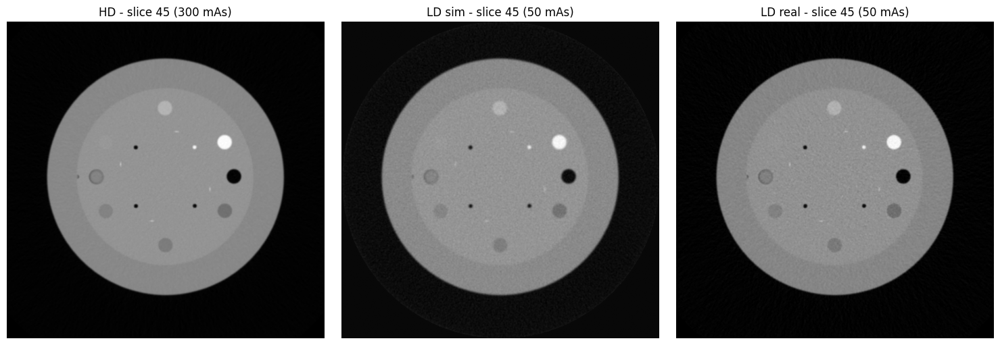

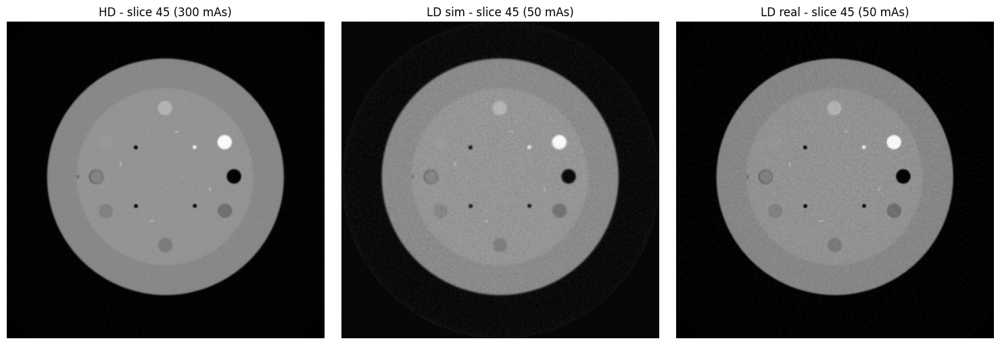

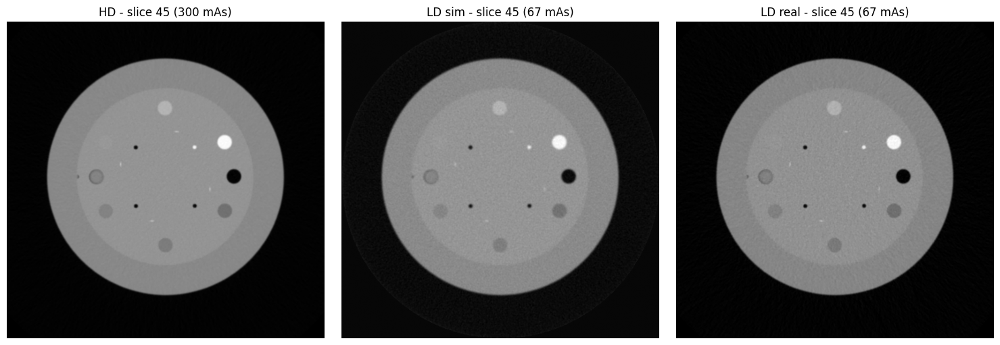

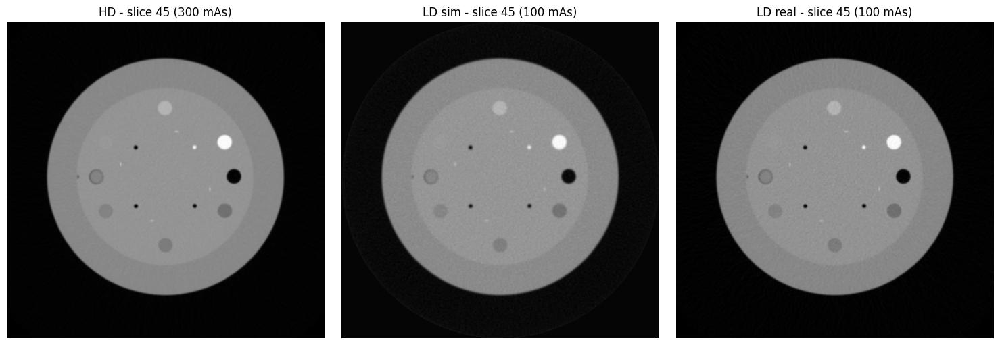

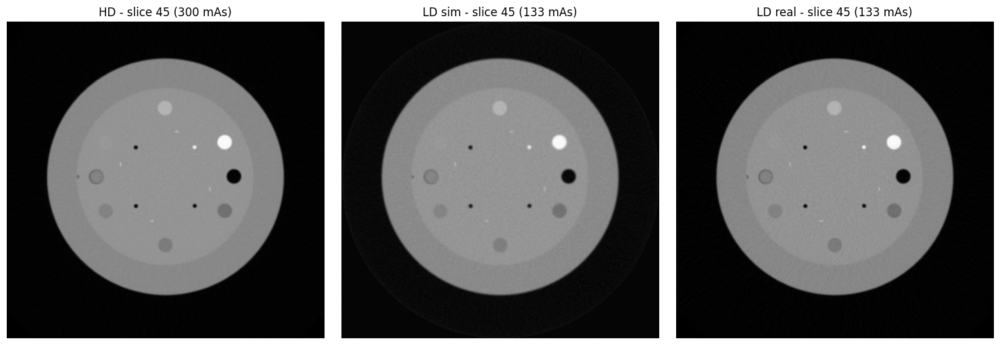

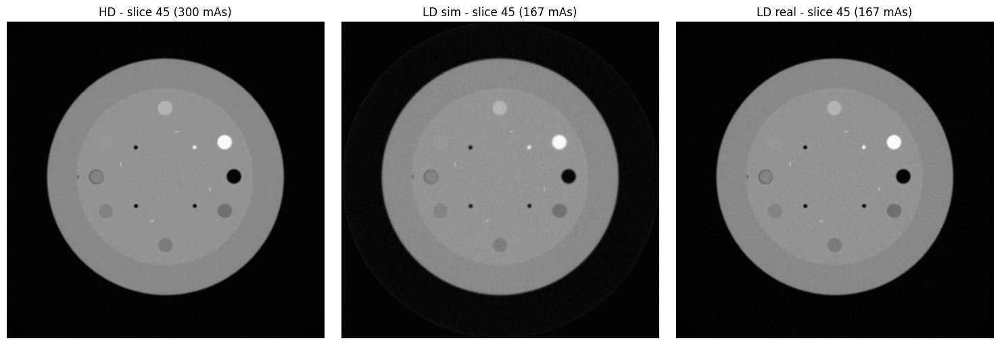

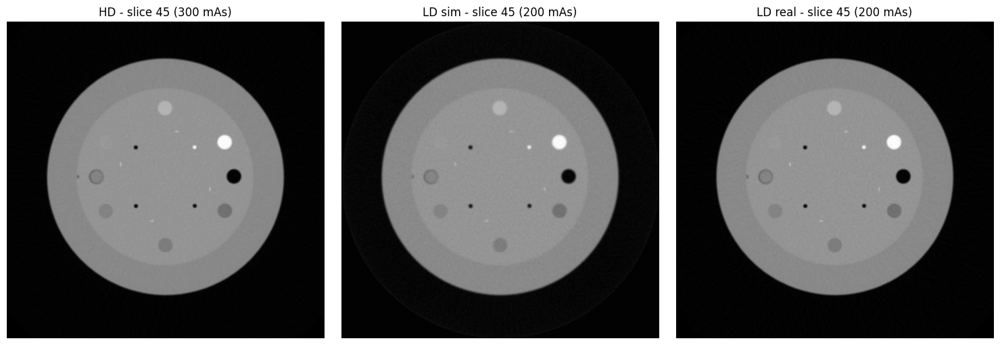

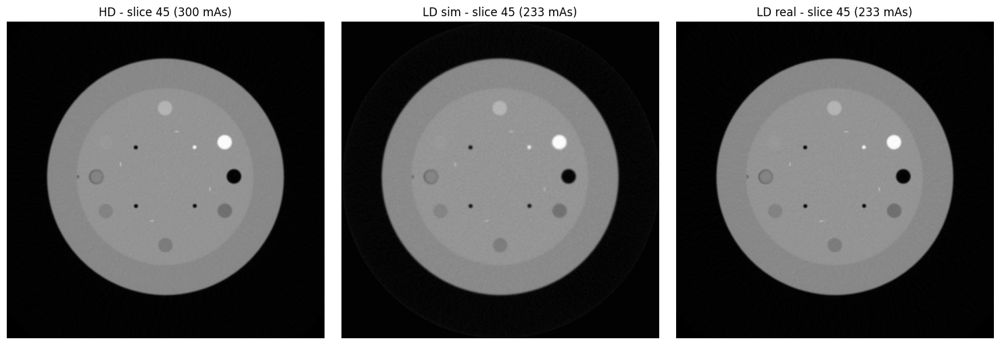

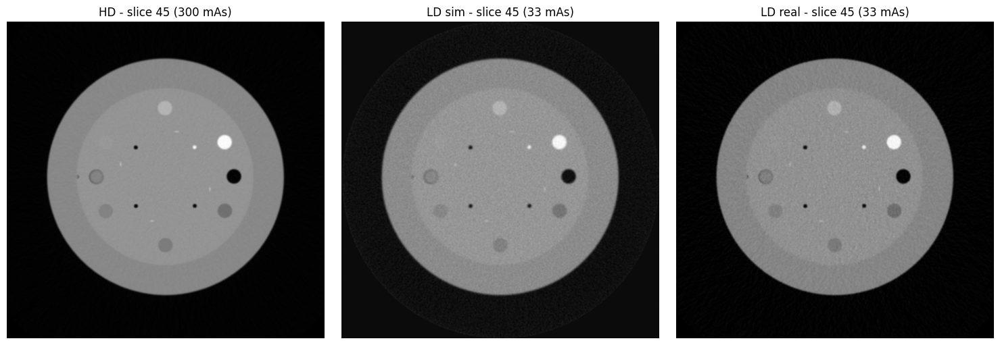

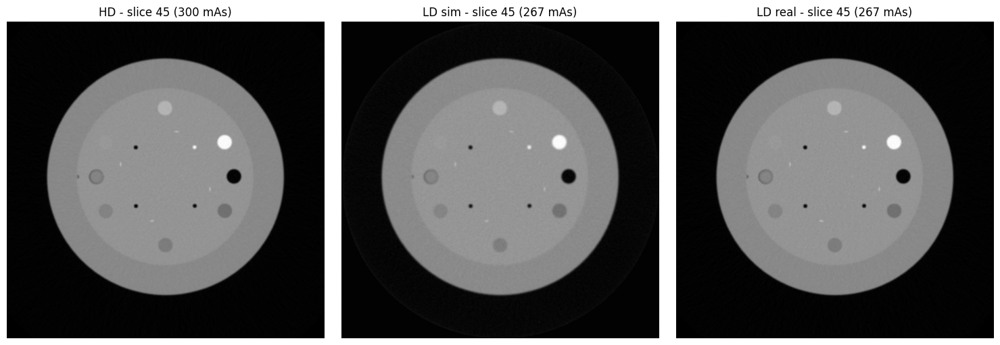

In [47]:
base_nii = "/home/cfigueroa/LDCT_respaldo/dosis8_9/dosis8_sim2/low_slices_real_811_high_075_Hr40_3_B_Sn150kV_38_mas_300.nii"

mas = [50, 50, 67, 100, 133, 167, 200, 233, 33, 267, 300]
nums = [6,9,12,15,18,21,24,27,31,35,38]
nums2 = [3,5,3,3,3,3,3,3,3,3,3]

for i in range(1, 11):
    sim_nii = f"/home/cfigueroa/LDCT_respaldo/dosis8_9/dosis8_sim2/low_slices_sim_8{i}_high_075_Hr40_{nums2[i-1]}_B_Sn150kV_{nums[i-1]}_mas_{mas[i-1]}.nii"
    real_nii = f"/home/cfigueroa/LDCT_respaldo/dosis8_9/dosis8_sim2/low_slices_real_8{i}_high_075_Hr40_{nums2[i-1]}_B_Sn150kV_{nums[i-1]}_mas_{mas[i-1]}.nii"
    plot_random_slice_three_nii(base_nii, sim_nii, real_nii, mas[i-1])

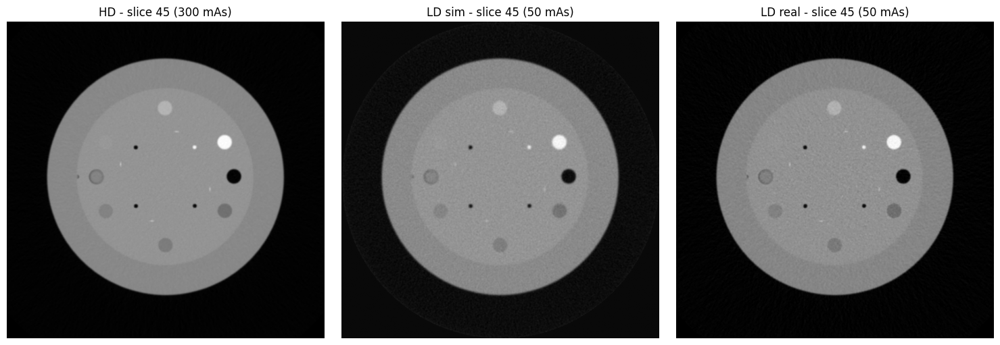

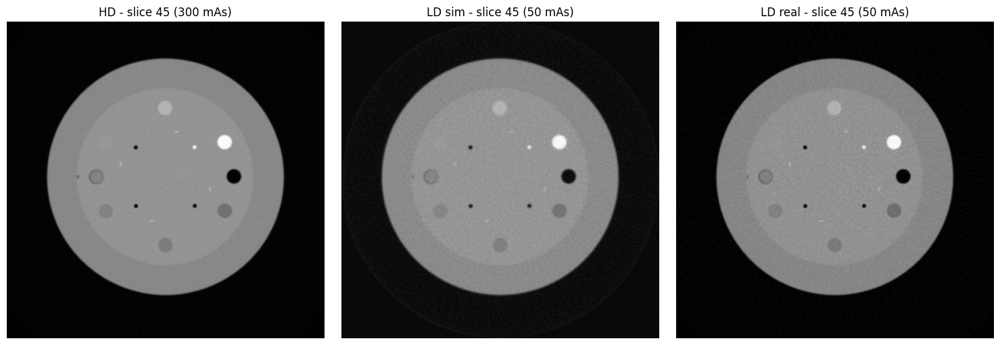

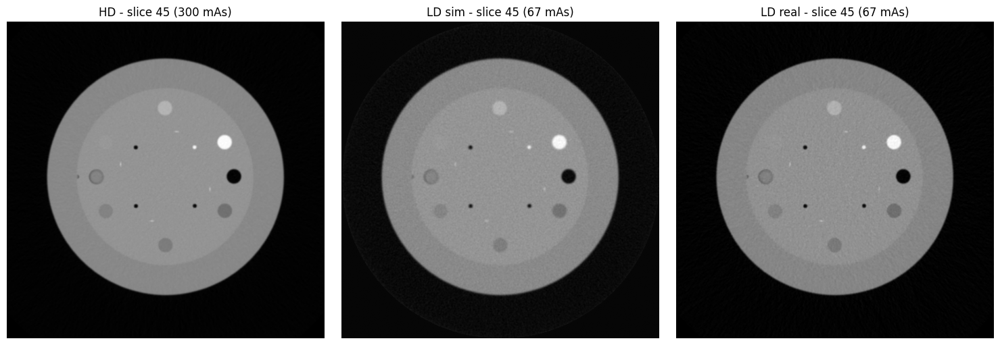

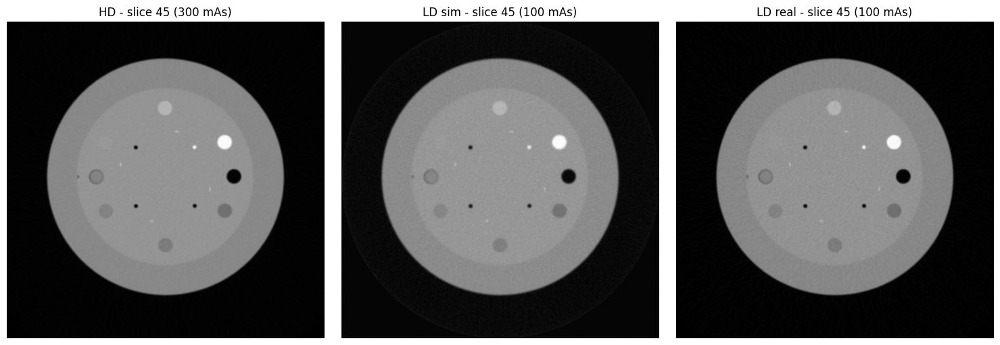

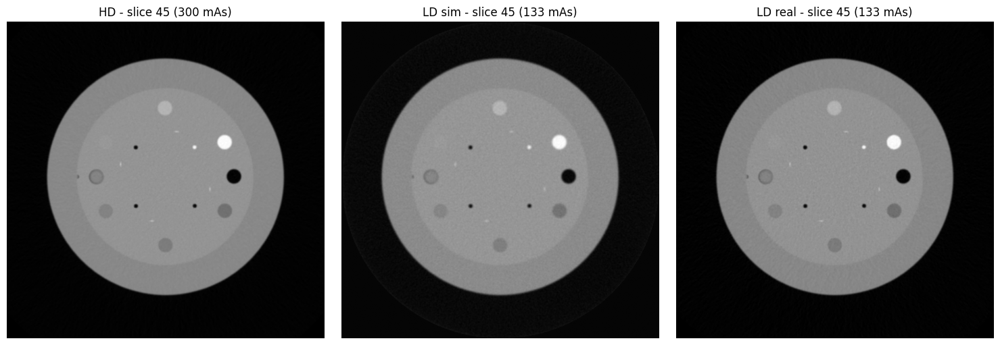

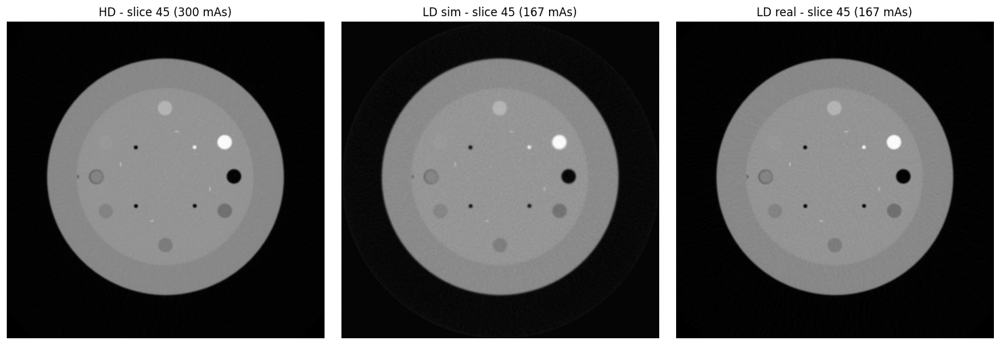

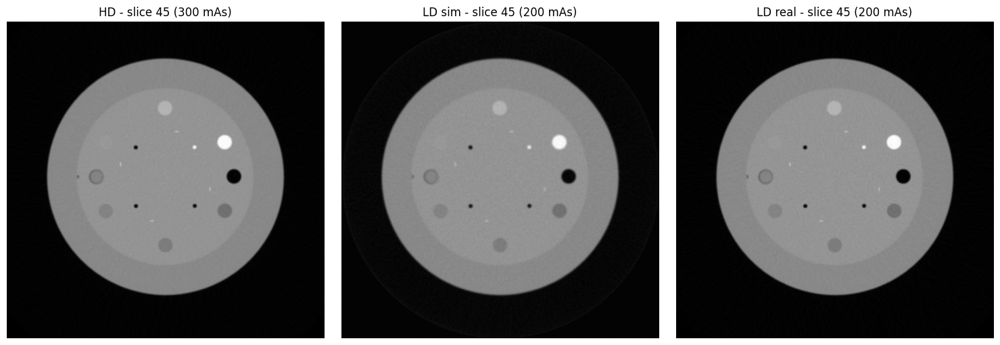

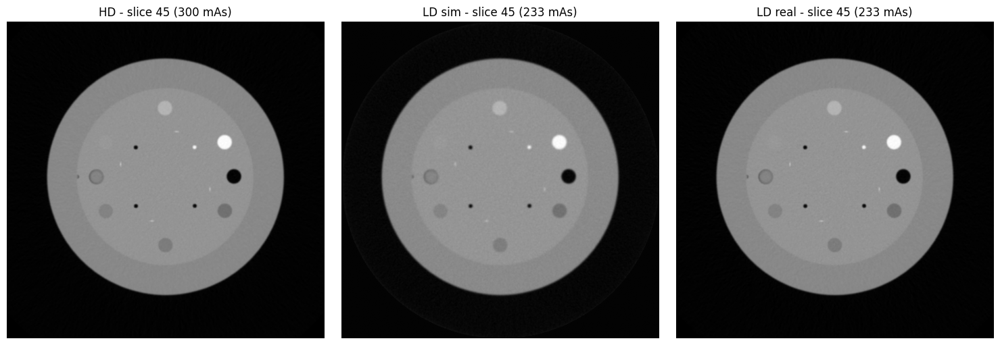

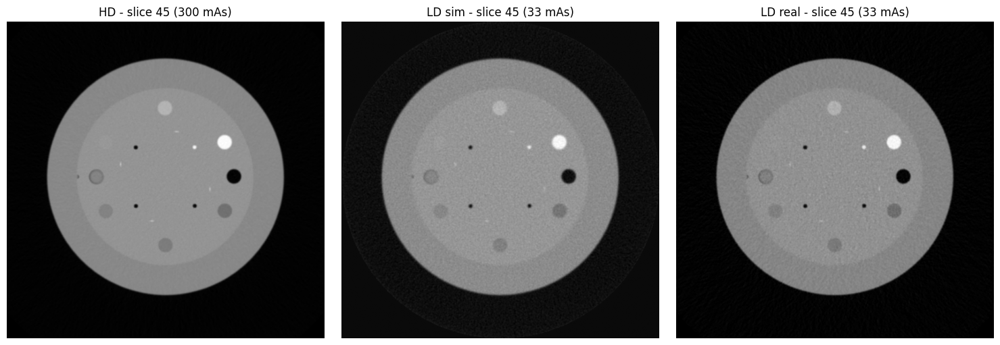

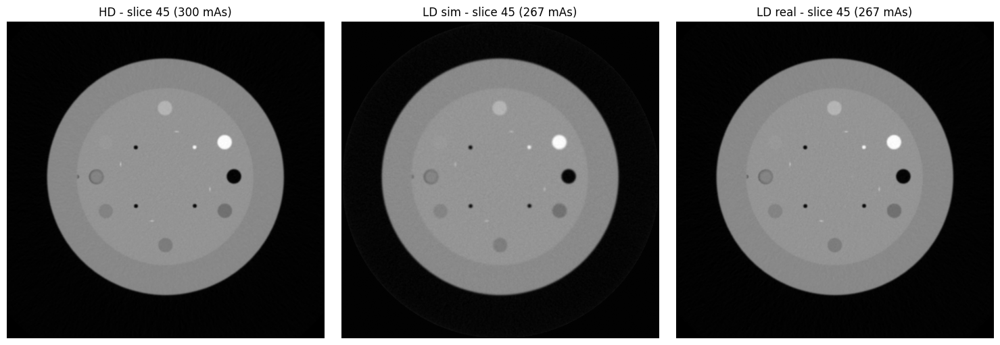

In [48]:
base_nii = "/home/cfigueroa/LDCT_respaldo/dosis8_9/dosis8_sim/low_slices_real_811_high_075_Hr40_3_B_Sn150kV_38_mas_300.nii"

mas = [50, 50, 67, 100, 133, 167, 200, 233, 33, 267, 300]
nums = [6,9,12,15,18,21,24,27,31,35,38]
nums2 = [3,5,3,3,3,3,3,3,3,3,3]

for i in range(1, 11):
    sim_nii = f"/home/cfigueroa/LDCT_respaldo/dosis8_9/dosis8_sim/low_slices_sim_8{i}_high_075_Hr40_{nums2[i-1]}_B_Sn150kV_{nums[i-1]}_mas_{mas[i-1]}.nii"
    real_nii = f"/home/cfigueroa/LDCT_respaldo/dosis8_9/dosis8_sim/low_slices_real_8{i}_high_075_Hr40_{nums2[i-1]}_B_Sn150kV_{nums[i-1]}_mas_{mas[i-1]}.nii"
    plot_random_slice_three_nii(base_nii, sim_nii, real_nii, mas[i-1])